In [1]:
from models import StyleEncoder, MapperNetwork, Generator
from lpips_pytorch import LPIPS
from pathlib import Path
import torch
import numpy as np
from train import to_image
from datasets import CelebADataset
from utils import *
from torchvision import transforms

transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize(mean=means,
                            std=stds)
    ])


In [2]:
domains = ["Blond_Hair", "Eyeglasses", "Goatee", 'Male', \
        'Young', 'Black_Hair', 'Bald', 'Mouth_Slightly_Open', \
        'Pale_Skin', 'Wearing_Necklace']
N_domains = len(domains)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [21]:
CHECKPOINT_PATH = 'checkpoints/3ecx9prt/checkpoint-10000.pt'

generator = Generator()
mapper = MapperNetwork(K_domains=N_domains)
styler = StyleEncoder(N_domains)

state = torch.load(CHECKPOINT_PATH)
generator.load_state_dict(state['generator_ema'])
mapper.load_state_dict(state['mapper_ema'])
styler.load_state_dict(state['styler_ema'])
generator.to(device), mapper.to(device), styler.to(device)
del state

In [5]:
dataset = CelebADataset(transform=transform, attributes=domains)

In [6]:
references_images = []
i = 0
for domain in range(len(domains)):
    while dataset[i][1]['attributes'][domain] != 1:
        i += 1
    references_images.append(to_image(dataset[i][0]))
    i += 1

# Attribute conversion

Let's find images with different attributes and try to amplify each attribute using mapper

In [22]:
import copy
table = [[None] * (1 + N_domains) for i in range(N_domains + 1)]
for i in range(1, N_domains + 1):
    table[i][0] = table[0][i] = references_images[i - 1]

for image_i in range(N_domains):
    for attr_i in range(N_domains):
        with torch.no_grad():
            z_trg = torch.randn((1, 16)).to(device)
            s_trg = mapper(z_trg, torch.tensor([attr_i], device=device))
            x_real = transform(references_images[image_i]).to(device)
            x_fake = generator(x_real.unsqueeze(0), s_trg)
            table[attr_i + 1][image_i + 1] = to_image(x_fake[0])


/tmp/ipykernel_8650/197597748.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


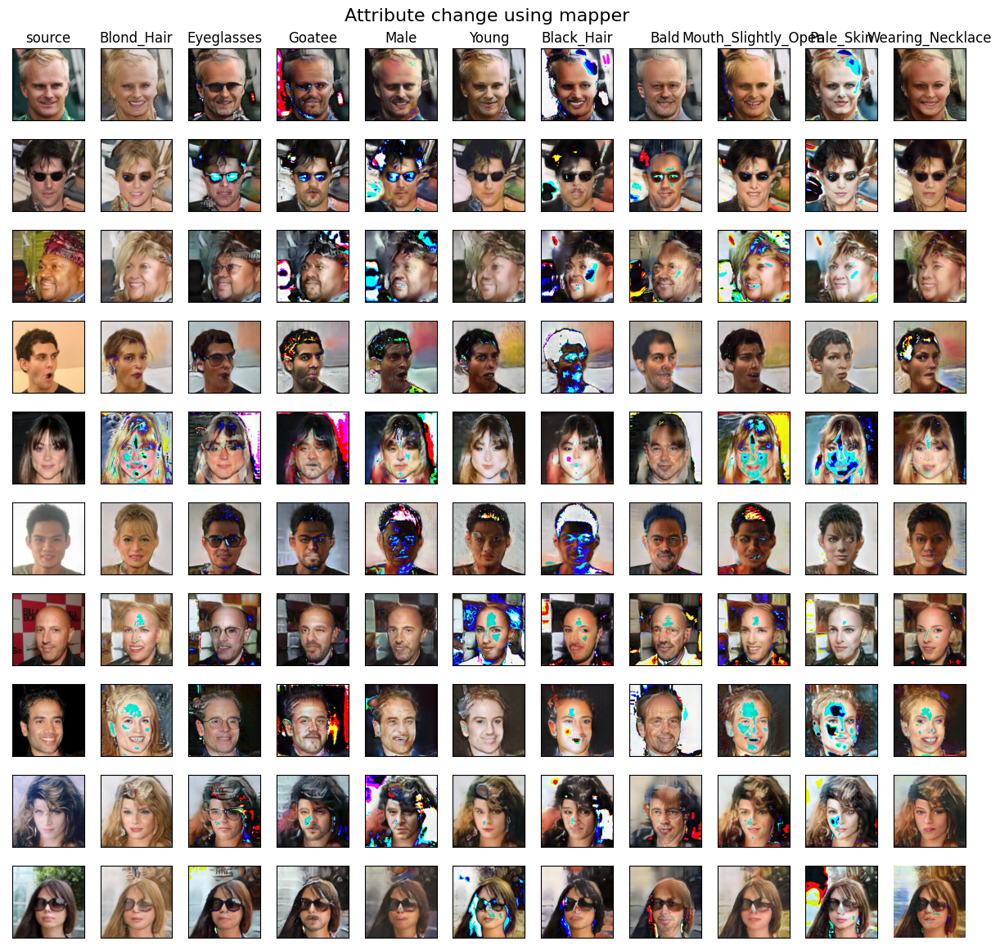

In [23]:
import matplotlib.pyplot as plt
R = N_domains + 1
C = N_domains
R, C = C, R

fig,ax = plt.subplots(R, C)
plt.axis('off')
fig.suptitle('Attribute change using mapper', fontsize=16)

for c in range(C):
    for r in range(R):
        image = table[c][r + 1]
        ax[r][c].imshow(image)
        fig.axes[r * C + c].get_xaxis().set_visible(False)
        fig.axes[r * C + c].get_yaxis().set_visible(False)
        ax[r][c].figure.set_size_inches(12, 12)
        if r == 0:
            if c >= 1:
                ax[r][c].set_title(domains[c - 1])
            else:
                ax[r][c].set_title("source")

for i in range(10):
    fig.tight_layout()
fig.show()

There are adversarial artifacts about half of the time. This fact + loss plots indicate undertraining.
Subject identities are more or less preserved. 

The model especially struggles with "wearing necklace", "young" attributes.

Domains are entagled. For example, in order to make subject wear glasses the model makes him/her to look more manly.

### Let's try to convert attributes based on another picture (styler)


In [24]:
import copy
table = [[None] * (1 + N_domains) for i in range(N_domains + 1)]
for i in range(1, N_domains + 1):
    table[i][0] = table[0][i] = references_images[i - 1]

for image_i in range(N_domains):
    for attr_i in range(N_domains):
        with torch.no_grad():
            z_trg = torch.randn((1, 16)).to(device)
            attr_image = transform(references_images[attr_i]).unsqueeze(0).to(device)
            s_trg = styler(attr_image, torch.tensor([attr_i], device=device))
            x_real = transform(references_images[image_i]).to(device)
            x_fake = generator(x_real.unsqueeze(0), s_trg)
            table[attr_i + 1][image_i + 1] = to_image(x_fake[0])


/tmp/ipykernel_8650/4139240084.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


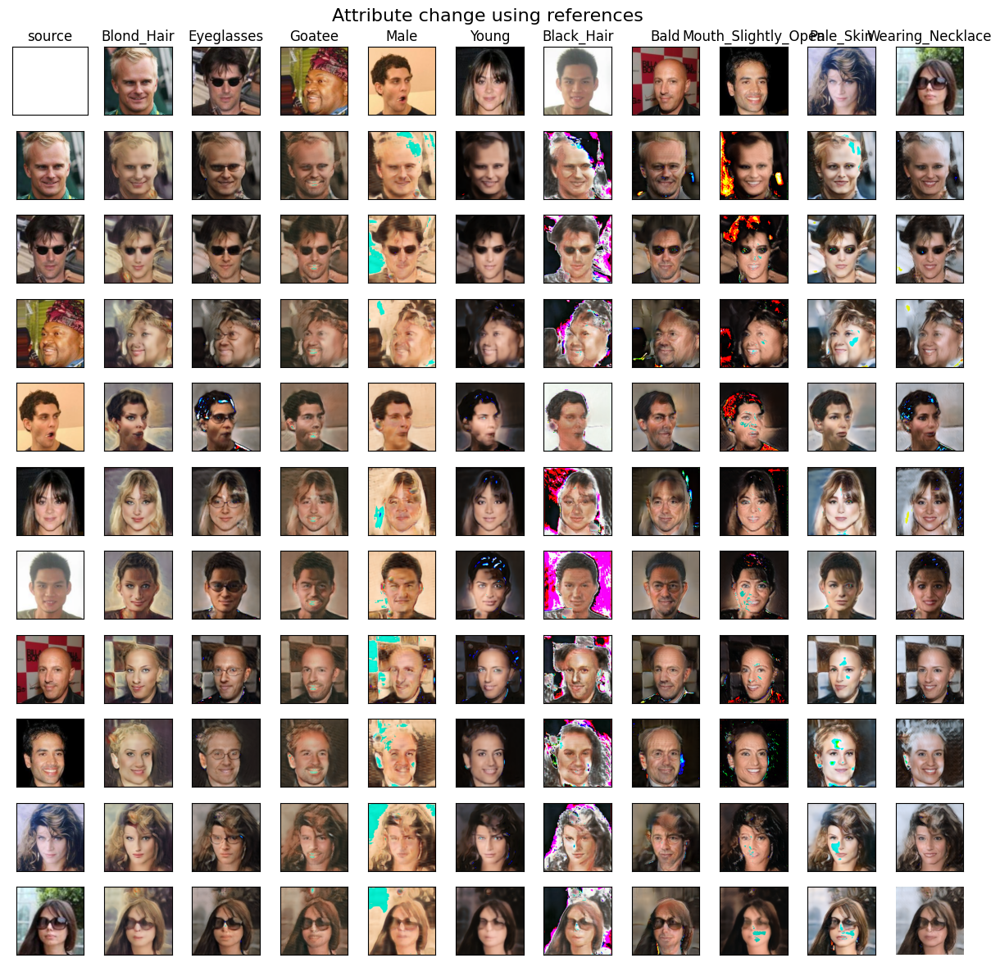

In [25]:
import matplotlib.pyplot as plt
R = N_domains + 1
C = N_domains + 1

fig,ax = plt.subplots(R, C)
plt.axis('off')
fig.suptitle('Attribute change using references', fontsize=16)

for c in range(C):
    for r in range(R):
        image = table[c][r]
        if r != 0 or c != 0:
            ax[r][c].imshow(image)
        fig.axes[r * C + c].get_xaxis().set_visible(False)
        fig.axes[r * C + c].get_yaxis().set_visible(False)
        ax[r][c].figure.set_size_inches(12, 12)
        if r == 0:
            if c >= 1:
                ax[r][c].set_title(domains[c - 1])
            else:
                ax[r][c].set_title("source")

for i in range(10):
    fig.tight_layout()
fig.show()

It seems that model copies color scheme from the reference images.
The model preserves source image identity.

The color scheme effect is especially visible on "male" source image column.

The quality of generated images is significantly better, than with mapper.

### What if we use mixed latents to edit attributes?

In [26]:
import copy
table = [[None] * (1 + N_domains) for i in range(N_domains + 1)]
for i in range(1, N_domains + 1):
    table[i][0] = table[0][i] = references_images[i - 1]

for image_i in range(N_domains):
    for attr_i in range(N_domains):
        with torch.no_grad():
            z_trg = torch.randn((1, 16)).to(device)
            attr_image = transform(references_images[attr_i]).unsqueeze(0).to(device)
            x_real = transform(references_images[image_i]).to(device)
            s_trg1 = styler(attr_image, torch.tensor([attr_i], device=device))
            s_trg2 = styler(x_real, torch.tensor([attr_i], device=device))
            s_trg = 0.5 * s_trg1 + 0.5 * s_trg2
            x_fake = generator(x_real.unsqueeze(0), s_trg)
            table[attr_i + 1][image_i + 1] = to_image(x_fake[0])


/tmp/ipykernel_8650/3557702855.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


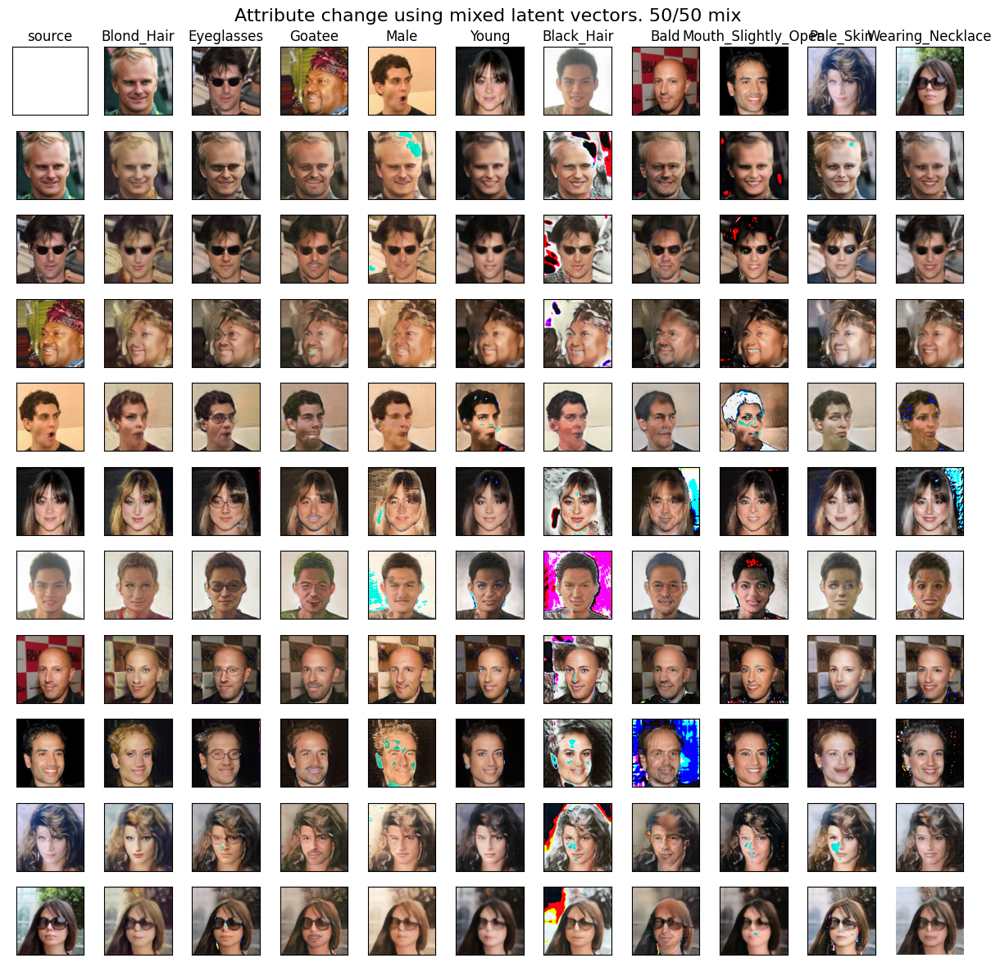

In [27]:
import matplotlib.pyplot as plt
R = N_domains + 1
C = N_domains + 1

fig,ax = plt.subplots(R, C)
plt.axis('off')
fig.suptitle('Attribute change using mixed latent vectors. 50/50 mix', fontsize=16)

for c in range(C):
    for r in range(R):
        image = table[c][r]
        if r != 0 or c != 0:
            ax[r][c].imshow(image)
        fig.axes[r * C + c].get_xaxis().set_visible(False)
        fig.axes[r * C + c].get_yaxis().set_visible(False)
        ax[r][c].figure.set_size_inches(12, 12)
        if r == 0:
            if c >= 1:
                ax[r][c].set_title(domains[c - 1])
            else:
                ax[r][c].set_title("source")

for i in range(10):
    fig.tight_layout()
fig.show()

Images seem more or less the same as before, but adversarial artifacts change.

In [28]:
import copy
table = [[None] * (1 + N_domains) for i in range(N_domains + 1)]
for i in range(1, N_domains + 1):
    table[i][0] = table[0][i] = references_images[i - 1]

for image_i in range(N_domains):
    for attr_i in range(N_domains):
        with torch.no_grad():
            z_trg = torch.randn((1, 16)).to(device)
            attr_image = transform(references_images[attr_i]).unsqueeze(0).to(device)
            x_real = transform(references_images[image_i]).to(device)
            s_trg1 = styler(attr_image, torch.tensor([attr_i], device=device))
            s_trg2 = styler(x_real, torch.tensor([attr_i], device=device))
            s_trg = 0.0 * s_trg1 + 1.0 * s_trg2
            x_fake = generator(x_real.unsqueeze(0), s_trg)
            table[attr_i + 1][image_i + 1] = to_image(x_fake[0])


/tmp/ipykernel_8650/1874651556.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


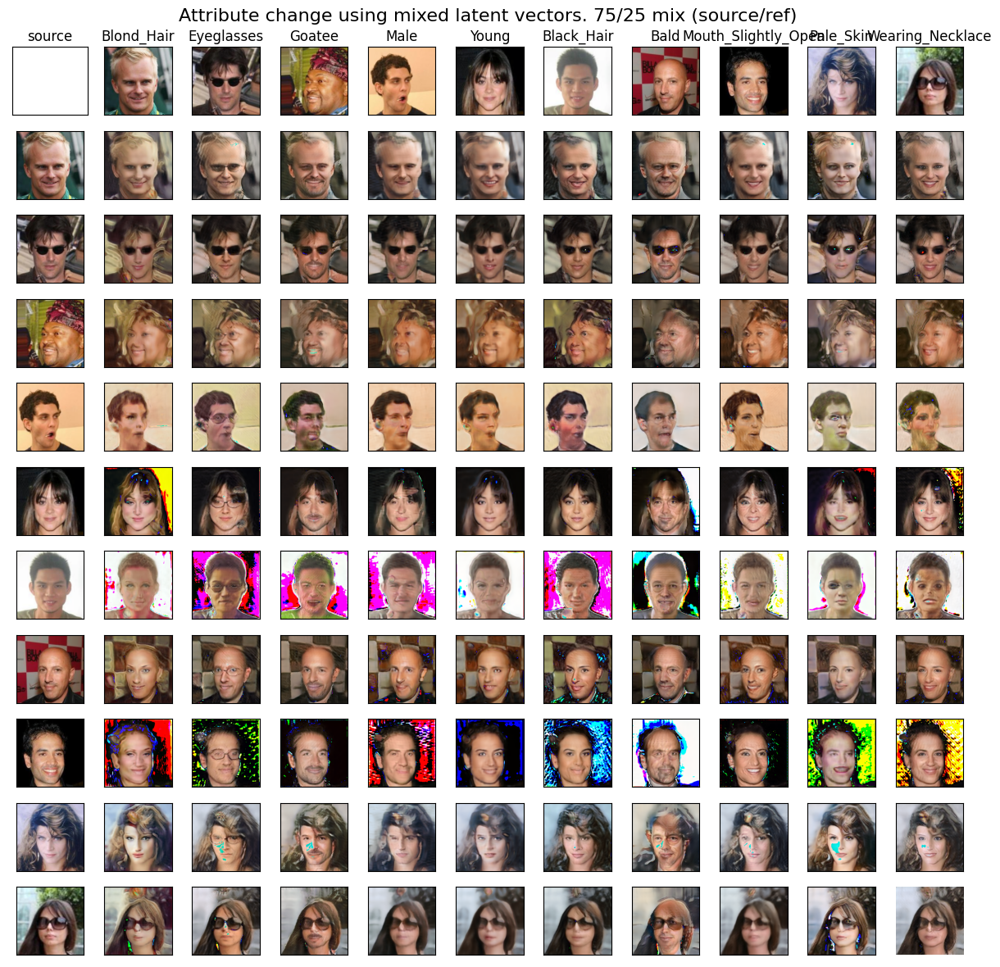

In [29]:
import matplotlib.pyplot as plt
R = N_domains + 1
C = N_domains + 1

fig,ax = plt.subplots(R, C)
plt.axis('off')
fig.suptitle('Attribute change using mixed latent vectors. 75/25 mix (source/ref)', fontsize=16)

for c in range(C):
    for r in range(R):
        image = table[c][r]
        if r != 0 or c != 0:
            ax[r][c].imshow(image)
        fig.axes[r * C + c].get_xaxis().set_visible(False)
        fig.axes[r * C + c].get_yaxis().set_visible(False)
        ax[r][c].figure.set_size_inches(12, 12)
        if r == 0:
            if c >= 1:
                ax[r][c].set_title(domains[c - 1])
            else:
                ax[r][c].set_title("source")

for i in range(10):
    fig.tight_layout()
fig.show()

In [30]:
import copy
table = [[None] * (1 + N_domains) for i in range(N_domains + 1)]
for i in range(1, N_domains + 1):
    table[i][0] = table[0][i] = references_images[i - 1]

for image_i in range(N_domains):
    for attr_i in range(N_domains):
        with torch.no_grad():
            z_trg = torch.randn((1, 16)).to(device)
            attr_image = transform(references_images[attr_i]).unsqueeze(0).to(device)
            x_real = transform(references_images[image_i]).to(device)
            s_trg1 = styler(attr_image, torch.tensor([attr_i], device=device))
            s_trg2 = styler(x_real, torch.tensor([attr_i], device=device))
            s_trg = 0.75 * s_trg1 + 0.25 * s_trg2
            x_fake = generator(x_real.unsqueeze(0), s_trg)
            table[attr_i + 1][image_i + 1] = to_image(x_fake[0])


/tmp/ipykernel_8650/70533988.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


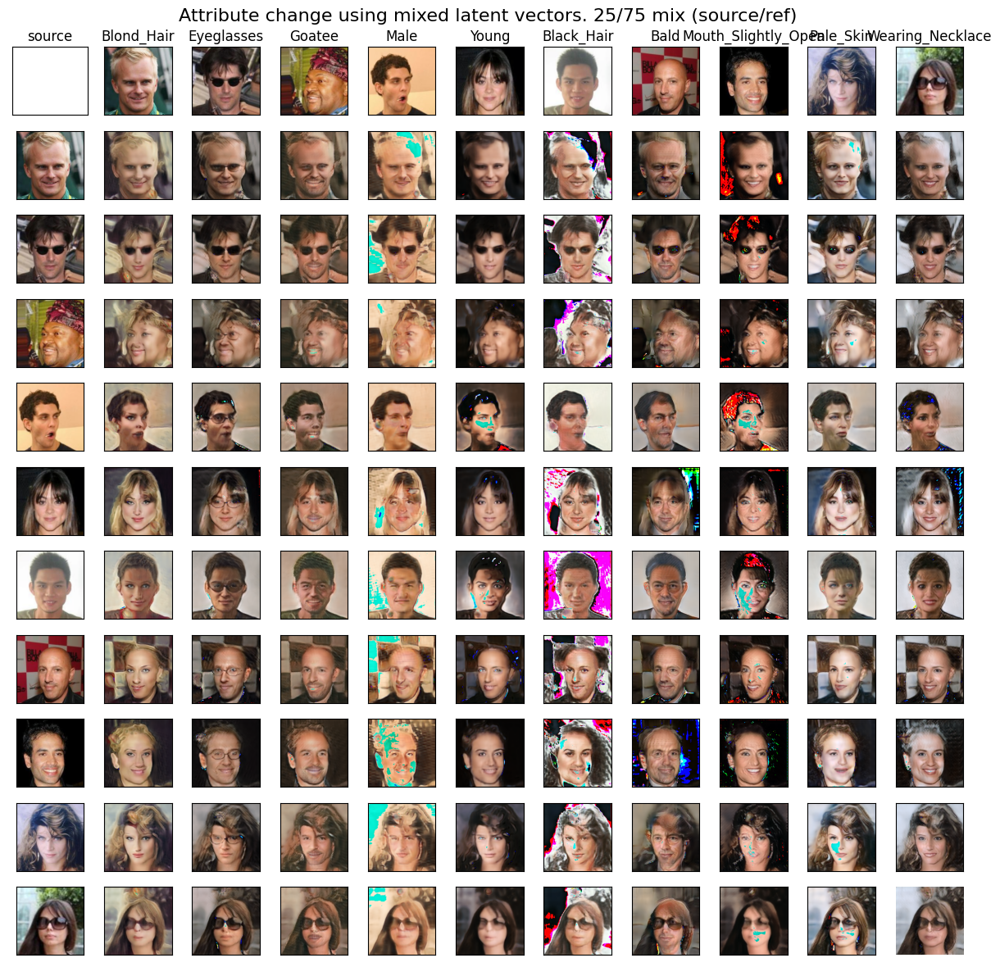

In [31]:
import matplotlib.pyplot as plt
R = N_domains + 1
C = N_domains + 1

fig,ax = plt.subplots(R, C)
plt.axis('off')
fig.suptitle('Attribute change using mixed latent vectors. 25/75 mix (source/ref)', fontsize=16)

for c in range(C):
    for r in range(R):
        image = table[c][r]
        if r != 0 or c != 0:
            ax[r][c].imshow(image)
        fig.axes[r * C + c].get_xaxis().set_visible(False)
        fig.axes[r * C + c].get_yaxis().set_visible(False)
        ax[r][c].figure.set_size_inches(12, 12)
        if r == 0:
            if c >= 1:
                ax[r][c].set_title(domains[c - 1])
            else:
                ax[r][c].set_title("source")

for i in range(10):
    fig.tight_layout()
fig.show()

**It's not the best validation to view latent mixing. Let's try gifs**

Note, that they must be viewed as files, cause I've not managed to animate them in Jupyter

In [32]:
from PIL import Image
from IPython import display
import matplotlib.image as mpimg


def make_gif(img1, img2, attr_i, filename='mygif.gif'):
    images = []
    alphas = list(i / 100 for i in range(100))
    
    IMAGE1 = transform(img1).unsqueeze(0).to(device)
    IMAGE2 = transform(img2).unsqueeze(0).to(device)
    
    for alpha in alphas:
        s_trg1 = styler(IMAGE1, torch.tensor([attr_i], device=device))
        s_trg2 = styler(IMAGE2, torch.tensor([attr_i], device=device))
        s_trg = alpha * s_trg1 + (1 - alpha) * s_trg2
        x_fake = generator(IMAGE1, s_trg)
        images.append(to_image(x_fake[0]))
    
    images[0].save(filename, format="GIF", save_all=True, append_images=images[1:], optimize=False, duration=2, loop=1)
    img = mpimg.imread(filename)
    plt.imshow(img)

    return Image.open(filename)

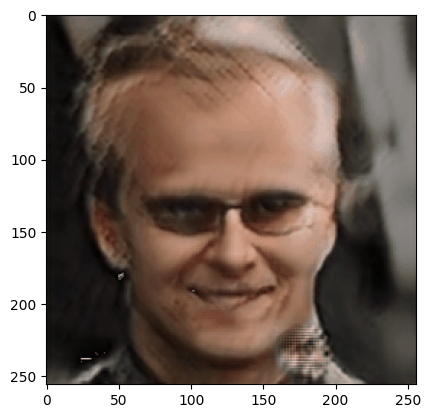

In [33]:
make_gif(references_images[0], references_images[1], 1, '1-1.gif')
pass

if we look closely, we can see that the only noticable change is adversarial pixel spot at the bottom of the picture.

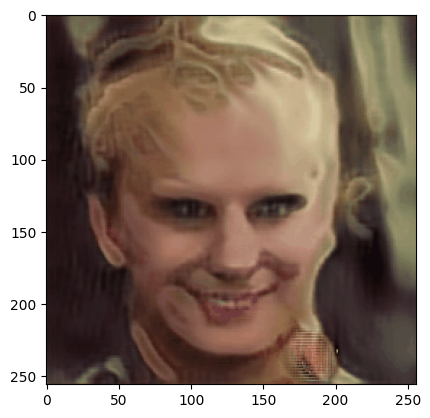

In [34]:
make_gif(references_images[0], references_images[1], 0, '1-1-0.gif')
pass

If we use "blond hair" domain with unsuitable picture, the results will be disappoining.

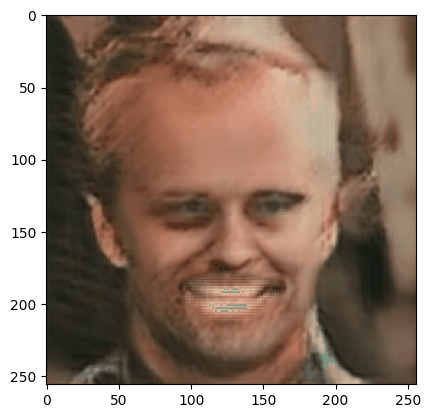

In [35]:
make_gif(references_images[0], references_images[2], 2, '1-2-2.gif')
pass

We've found no meaningful transformation by mixing latents.